In [ ]:
pip install torch torchvision pillow matplotlib


  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import copy
import os

In [ ]:
def load_image(image_path, max_size=400, shape=None):
    image = Image.open(image_path).convert('RGB')

    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)

    if shape:
        size = shape

    in_transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406),
                             (0.229, 0.224, 0.225))])

    image = in_transform(image)[:3, :, :].unsqueeze(0)

    return image

def imshow(tensor, title=None):
    image = tensor.clone().cpu().detach().numpy().squeeze()
    image = image.transpose(1, 2, 0)
    image = image * (0.229, 0.224, 0.225) + (0.485, 0.456, 0.406)
    image = image.clip(0, 1)
    plt.imshow(image)
    if title:
        plt.title(title)
    plt.pause(0.001)

def save_image(tensor, path):
    image = tensor.clone().cpu().detach().numpy().squeeze()
    image = image.transpose(1, 2, 0)
    image = image * (0.229, 0.224, 0.225) + (0.485, 0.456, 0.406)
    image = image.clip(0, 1)
    image = Image.fromarray((image * 255).astype('uint8'))
    image.save(path)


content = load_image('/lion.jpg')
style = load_image('/vg_wheat_field_cropped.jpg', shape=[content.size(2), content.size(3)])


In [ ]:
class VGG(nn.Module):
    def __init__(self):
        super(VGG, self).__init__()
        self.chosen_features = ['0', '5', '10', '19', '28']
        self.model = models.vgg19(pretrained=True).features[:29]

    def forward(self, x):
        features = []
        for layer_num, layer in enumerate(self.model):
            x = layer(x)
            if str(layer_num) in self.chosen_features:
                features.append(x)
        return features


In [ ]:
def content_loss(target_features, content_features):
    return torch.mean((target_features - content_features) ** 2)

def gram_matrix(tensor):
    _, d, h, w = tensor.size()
    tensor = tensor.view(d, h * w)
    gram = torch.mm(tensor, tensor.t())
    return gram

def style_loss(target_features, style_grams):
    style_loss = 0
    for target_feature, style_gram in zip(target_features, style_grams):
        _, d, h, w = target_feature.shape
        target_gram = gram_matrix(target_feature)
        layer_style_loss = torch.mean((target_gram - style_gram) ** 2)
        style_loss += layer_style_loss / (d * h * w)
    return style_loss


In [ ]:
def run_style_transfer(content_img, style_img, content_weight=1e5, style_weight=1e10, num_steps=300):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    vgg = VGG().to(device).eval()

    content_img = content_img.to(device)
    style_img = style_img.to(device)
    target_img = content_img.clone().requires_grad_(True).to(device)

    # Define optimizer
    optimizer = optim.LBFGS([target_img.requires_grad_()])

    style_features = vgg(style_img)
    content_features = vgg(content_img)
    style_grams = [gram_matrix(feature) for feature in style_features]

    output_dir = '/Outputs'
    os.makedirs(output_dir, exist_ok=True)


    def closure():
        optimizer.zero_grad()
        target_features = vgg(target_img)
        c_loss = content_loss(target_features[1], content_features[1])
        s_loss = style_loss(target_features, style_grams)
        total_loss = content_weight * c_loss + style_weight * s_loss
        total_loss.backward(retain_graph=True)
        return total_loss

    for step in range(num_steps):
        optimizer.step(closure)

        if step % 1 == 0:
            print(f"Step {step}")
            imshow(target_img, title='Output Image')
            save_path = os.path.join(output_dir, f'output_step_{step}.jpg')
            save_image(target_img, save_path)

    return target_img


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:04<00:00, 117MB/s] 


Step 0


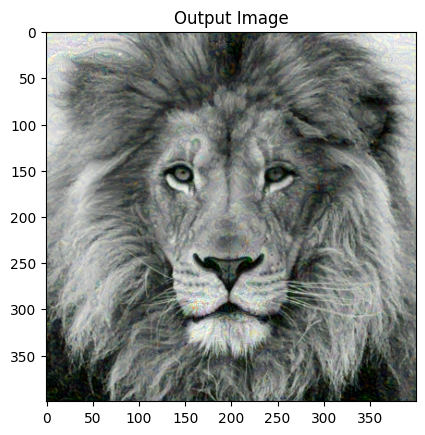

Step 1


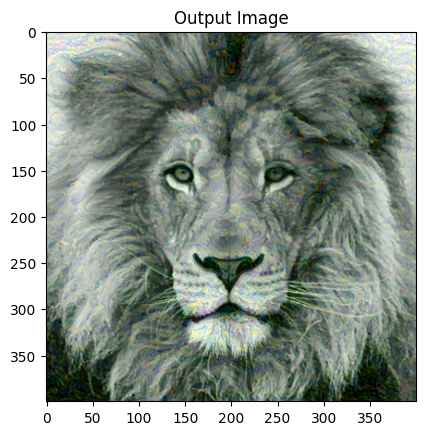

Step 2


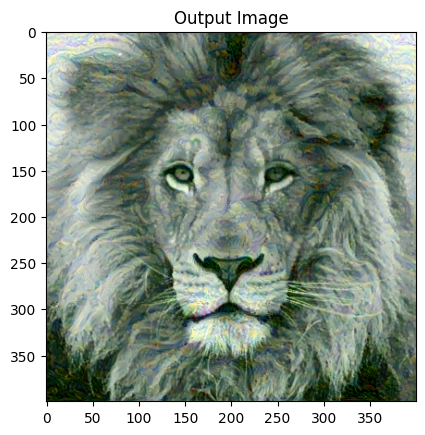

Step 3


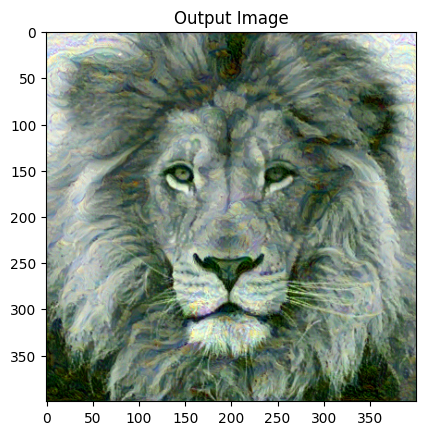

Step 4


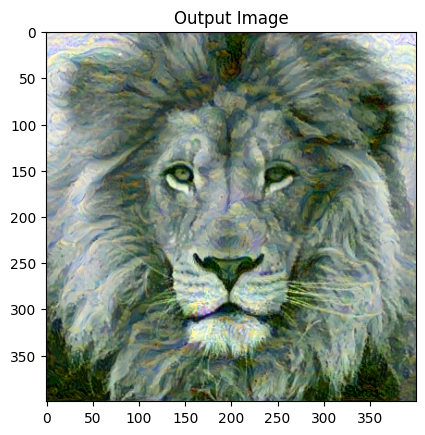

Step 5


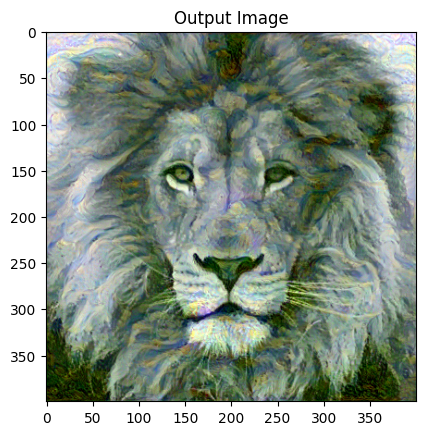

Step 6


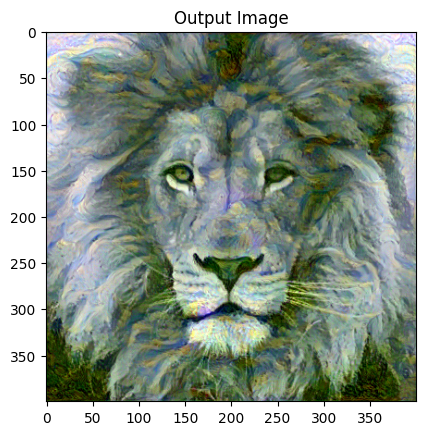

Step 7


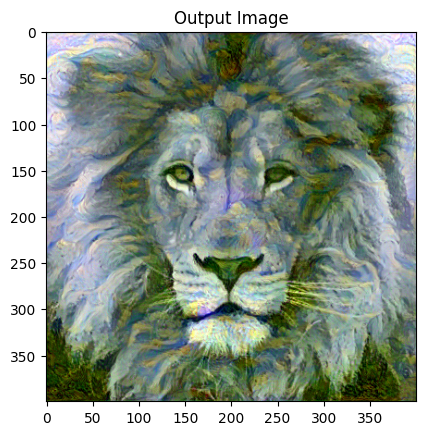

Step 8


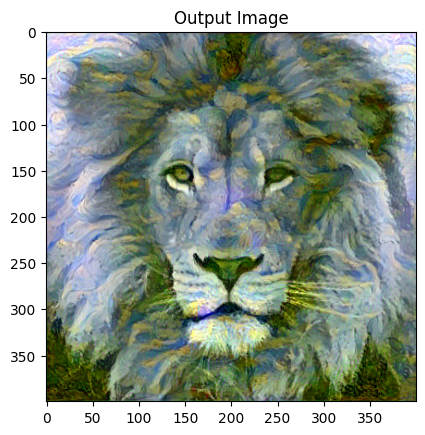

Step 9


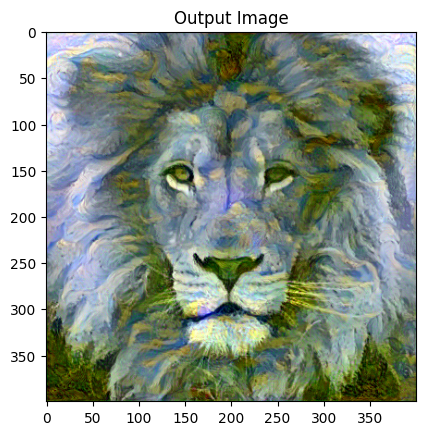

Step 10


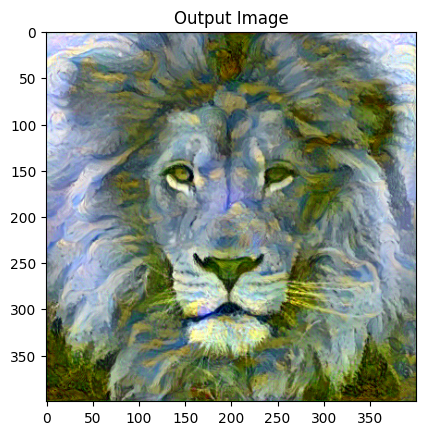

Step 11


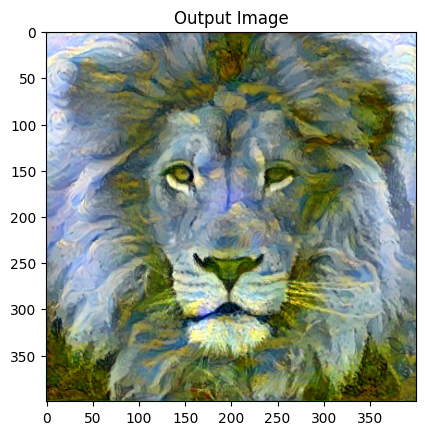

Step 12


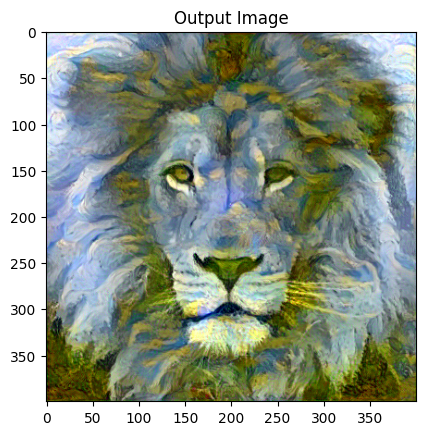

Step 13


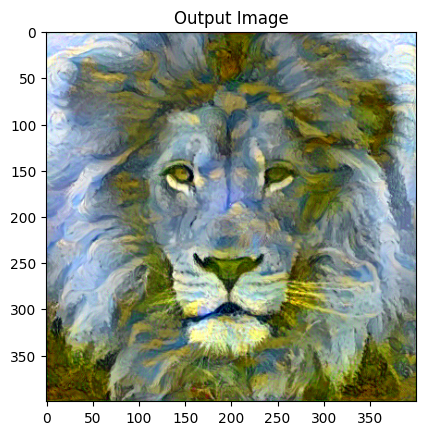

Step 14


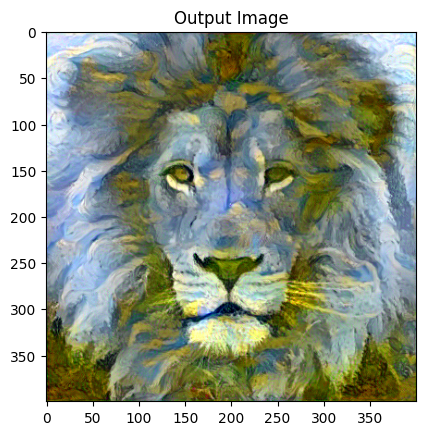

Step 15


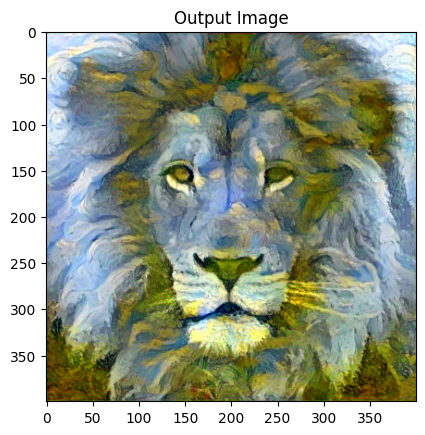

Step 16


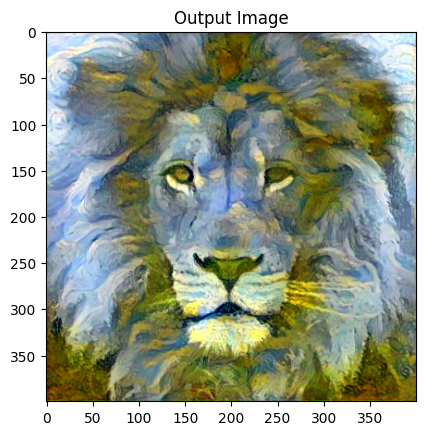

Step 17


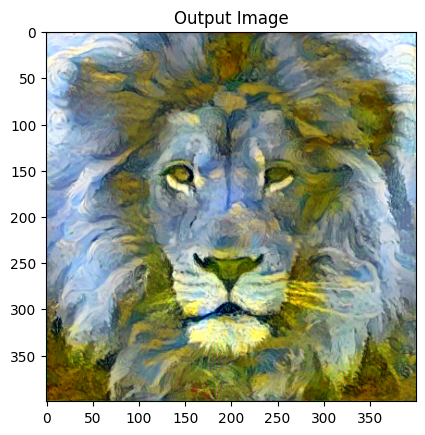

Step 18


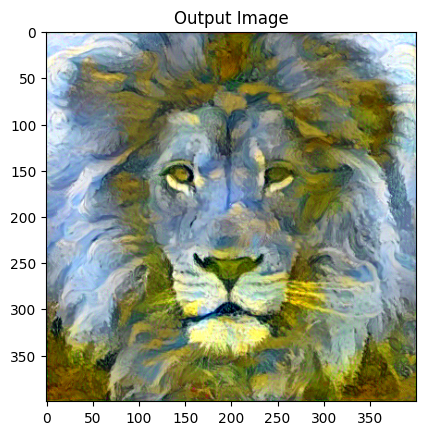

Step 19


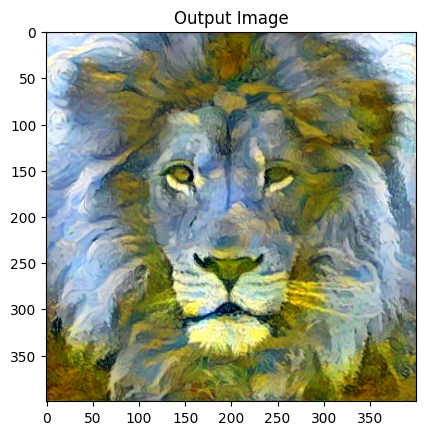

Step 20


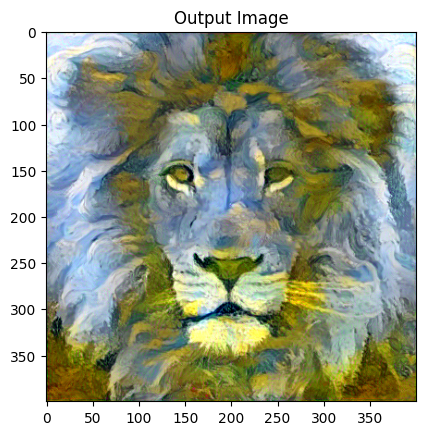

Step 21


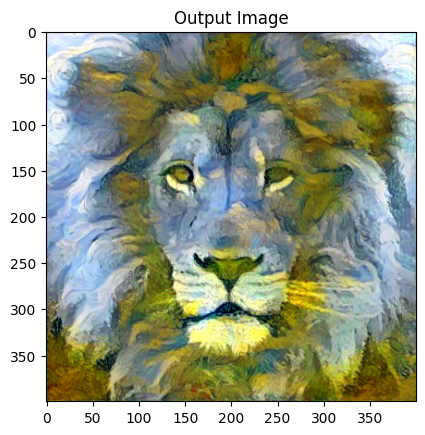

Step 22


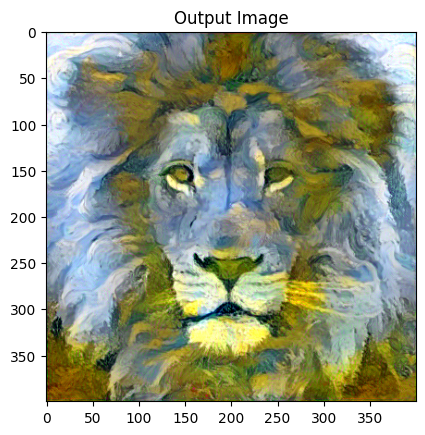

Step 23


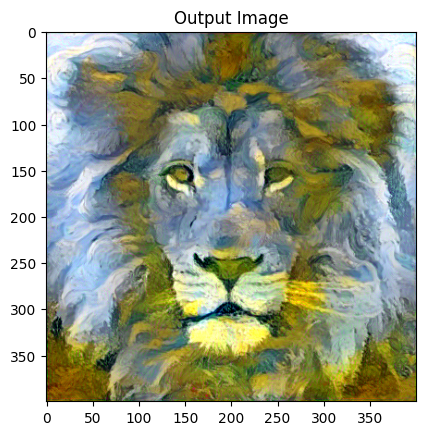

Step 24


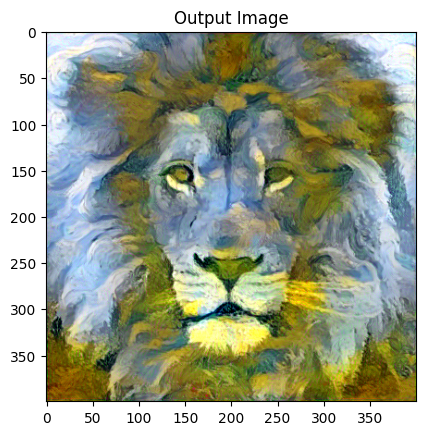

Step 25


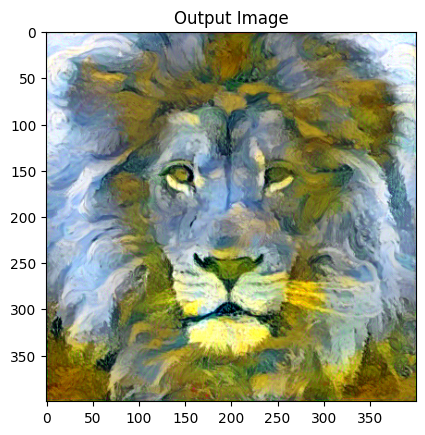

Step 26


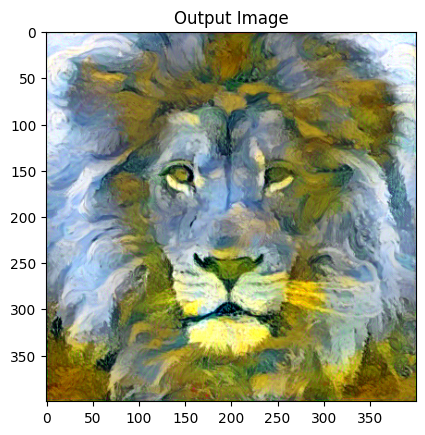

Step 27


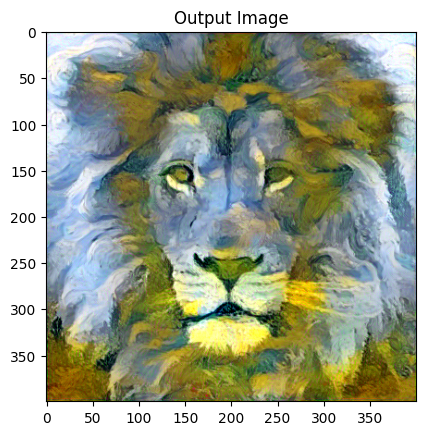

Step 28


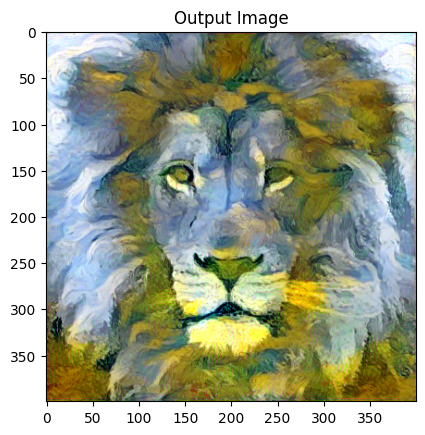

Step 29


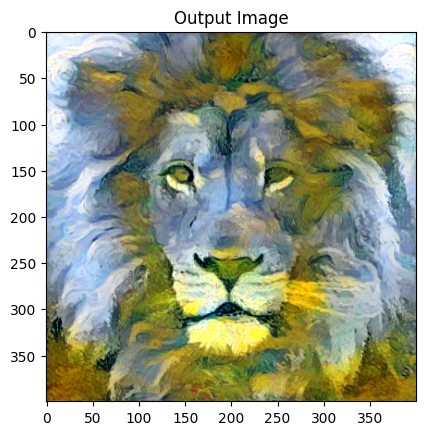

Step 30


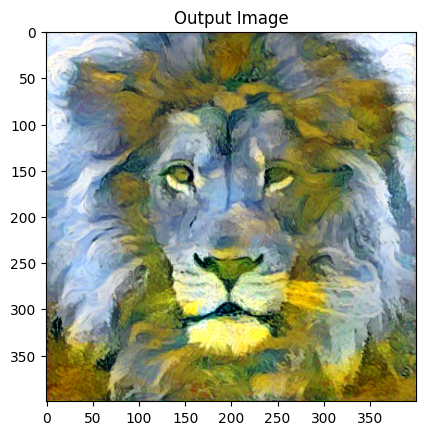

Step 31


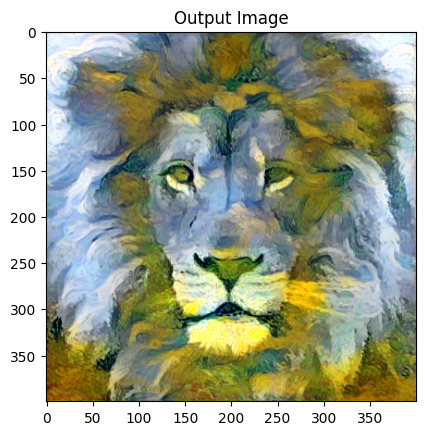

Step 32


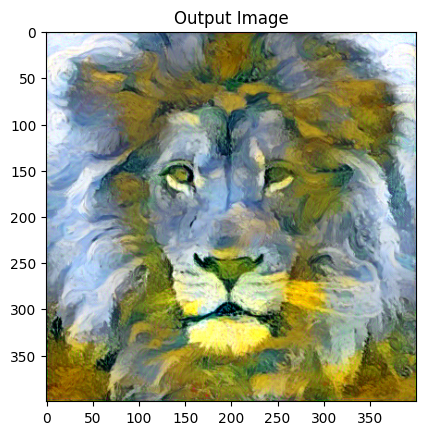

Step 33


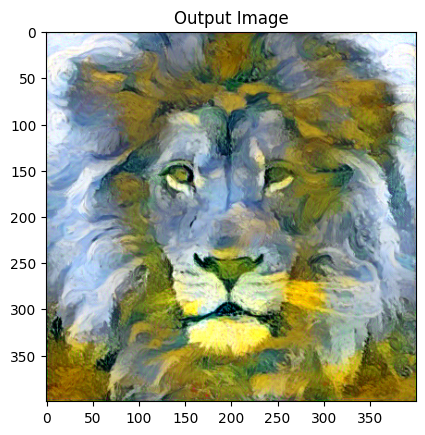

Step 34


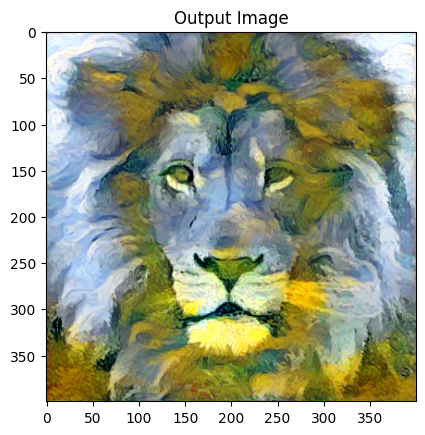

Step 35


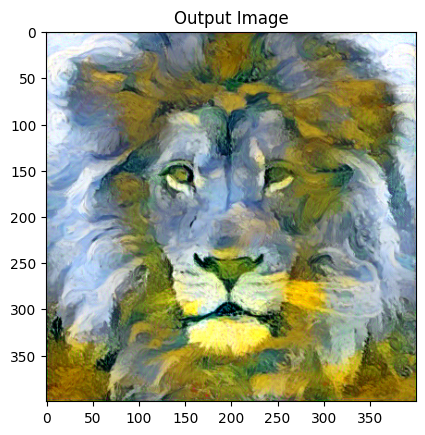

Step 36


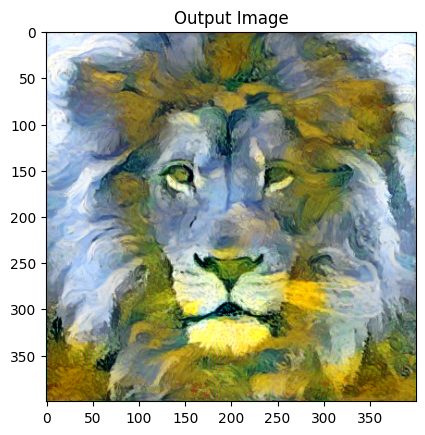

Step 37


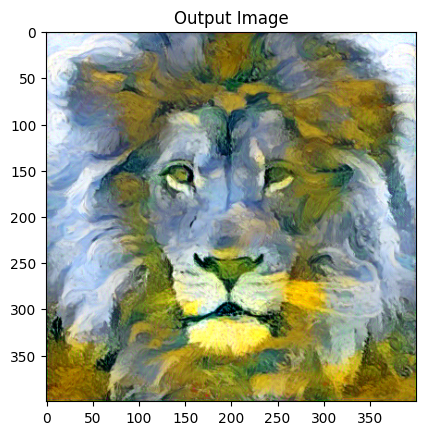

Step 38


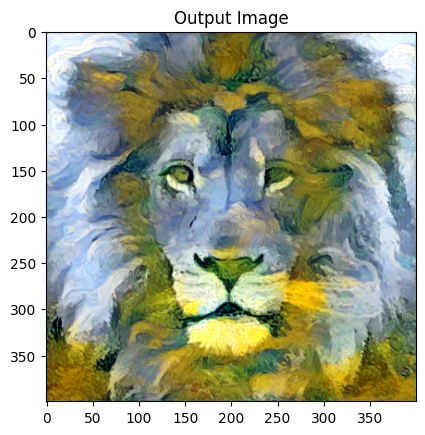

Step 39


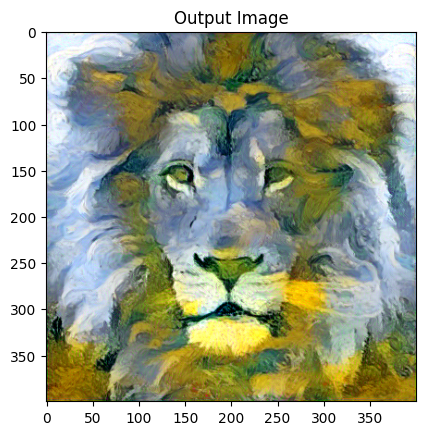

In [ ]:
output = run_style_transfer(content, style)
imshow(output, title='Final Output Image')
save_image(output, 'final_output_image.jpg')
plt.show()